In [1]:
from scipy import signal
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from glob import glob
import random

## Utility Functions

#### Function to Lines on the Given Images

In [2]:
# Function to Draw Epipolar Lines on the Given Images
def drawlines(img1,img2,lines,pts1,pts2):
    '''
        Give two images and points on the images, plot lines joing the corresponding points.
        
        Keyword Arguments:
            img1  -- First Image
            img2  -- Second Image
            lines -- Set of Lines to plot
            pts1  -- Image points of the first image
            pts2  -- Image points of the second image
            
        Return Values:
            img1  -- Image with lines plotted on first image
            img2  -- Image with lines plotted on second image
    '''
    r,c = img1.shape
    img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv2.circle(img1,tuple(pt1[0]),5,color,-1)
        img2 = cv2.circle(img2,tuple(pt2[0]),5,color,-1)
    return img1,img2

#### Function to draw the epipolar lines on the images

In [3]:
def plot_epipolar_lines(image1, image2, x, xs, F):
    '''
        Compute and plot epipolar lines given corresponding points of two images and the fundamental 
        matrix between them.
        
        Keyword Arguments:
            x  -- Points of the first image
            xs -- Points of the second image
            F  -- Fundamental Matrix between the two images
            
        Return Values:
            None
    '''
    # Find epilines corresponding to points in right image (second image) and
    # drawing its lines on left image
    lines1 = cv2.computeCorrespondEpilines(xs, 2,F)
    lines1 = lines1.reshape(-1,3)
    img5,img6 = drawlines(image1,image2,lines1,x,xs)

    # Find epilines corresponding to points in left image (first image) and
    # drawing its lines on right image
    lines2 = cv2.computeCorrespondEpilines(x, 1,F)
    lines2 = lines2.reshape(-1,3)
    img3,img4 = drawlines(image2,image1,lines2,xs,x)
    
    return img5, img3

#     plt.subplot(221),plt.imshow(img5)
#     plt.subplot(222),plt.imshow(img3)
#     plt.show()

#### Function to draw matches given the images

In [4]:
def draw_matches(image, matches, window_size, draw_lines = False):
    '''
       Draw matches on the conjoined image.
       
       Keyword Arguments:
           image       -- Concatenated input image
           matches     -- N*4 matrix containing matches
           window_size -- Block size used for matching
           draw_lines  -- Boolean indicating to draw lines between the matches (default = False)
           
        Return Values:
            image2     -- Resultant Images with matches drawn on it
    '''
    h, w, _ = image.shape

    image2 = image.copy()
    
    for match in matches:
        color = tuple(np.random.randint(0,255,3).tolist())
        start = (int(match[1] + window_size//2), int(match[0] + window_size//2))        
        end   = (int(match[3] + window_size//2 + w//2), int(match[2] + window_size//2))
        if draw_lines:
            image2 = cv2.line(image2, start, end, color, 3)
        image2 = cv2.circle(image2,start,6,(0, 0, 0),-1)
        image2 = cv2.circle(image2,start,5,color,-1)
        image2 = cv2.circle(image2,end,6,(0, 0, 0),-1)
        image2 = cv2.circle(image2,end,5,color,-1)
    return image2

## Normalised Cross Correlation
* We compute the normalised cross correlation between two signals using the formula given below
* \begin{equation}
    I^{'}_{1} = I_{1} - avg(I_1) \\
    I^{'}_{2} = I_{2} - avg(I_2) \\
    Correlation = \frac {sum( I^{'}_{1} * I^{'}_{2} )} {sqrt( norm( I^{'}_{1} ) + norm( I^{'}_{2} ) }
  \end{equation}

In [5]:
# Normalised Cross Correlation Function 
def n_cross_corr(image1, image2):
    '''
        Compute the normalised cross correlation between two N-dimensional signals,
        
        Keyword Arguments:
            image1 -- First Signal
            image2 -- Second Signal
            
        Return Values:
            n_corr -- Normalised Cross Correlation between the two signals
    '''
    
    # Mean Center the images
    image1 = image1 - image1.mean()
    image2 = image2 - image2.mean()
    
    # Calculate the Normalised Cross Correlation
    n_corr = np.sum(image1*image2) / np.sqrt( np.sum(image1**2) * np.sum(image2**2))
    
    return n_corr

## Intensity Based Window Correlation Matching
In order to perform Intensity Based Window Correlation Matching 
* Loop over the first image to extract out a window/block with the given specifications of window_size and stride.
* For each block extracted from the first image, loop over the second image and extract out all the blocks in the second image and perform *Normalised Cross Correlation* between the two blocks.
* The block pair with the highest normalised cross correlation are the blocks with the highest match.
* Match these blocks and continue the process untill all blocks of image 1 are processed

In [6]:
def patch_correlation_matching(image1, image2, window_size, stride):
    '''
        Perform Windowed Intensity Normalised Cross Correlation matching given two images.
        
        Keyword Arguments:
            image_left  -- Left Stereo Image
            image_right -- Right Stereo Image
            window_size -- Size of the window block
            stride      -- Size of the stride
        
        Return Values:
            matches     -- N*4 matrix containing matched keypoints
    '''

    # Get the shape of the input images
    h1, w1 = image1.shape
    h2, w2 = image2.shape

    matches = np.zeros((0,4))

    # Loop over the first image to generate query patches
    for i in range(0, h1-window_size, stride):
        for j in range(0, w1-window_size, stride):
            # Extract the query patch
            query_patch = image1[i:i+window_size, j:j+window_size]

            best_n_corr = -9999999
            best_match = (0,0)
            for ii in range(0, h2-window_size, stride):
                for jj in range(0, w2-window_size, stride):
                    # Extract patch
                    patch = image2[ii:ii+window_size, jj:jj+window_size]

                    # Perform Normalised Cross Correlation
                    n_corr = n_cross_corr(query_patch, patch)

                    # If Normalised Cross Correlation value if higher than the current best then update
                    if n_corr > best_n_corr:
                        best_n_corr = n_corr
                        best_match = (ii, jj)
            

            # Best Match for the current query patch            
            matches = np.concatenate((matches,np.array([[i, j, best_match[0], best_match[1]]])), axis=0)
    return matches

In [7]:
def SIFT_feature_extractor(image1, image2, nfeatures=500):
    # Feature Key Point Extractor
    sift = cv2.xfeatures2d.SIFT_create(nfeatures=nfeatures)
    
    # Create BF Matcher
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
    
    # Find keypoints and descriptors 
    kp1, desc1 = sift.detectAndCompute(image1, None)    
    kp2, desc2 = sift.detectAndCompute(image2, None)

    # Match descriptors
    matches = bf.match(desc1, desc2) 

    # Sort the matches in the order of their distance
    matches = sorted(matches, key = lambda x:x.distance)[:50]

    x = np.float32(np.array([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2))
    xs = np.float32(np.array([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2))
    
    return x, xs, matches

## Stereo Rectification
***
In order to perform Stereo Rectification, we perform the following steps,

* Find corresponding points in the two views
* Estimate the Fundamental (Uncalibrated Camera) or the Essential Matrix (Calibrated Camera) from the given two views
* Estimate the homography between the two views such that the epipolar lines become parallel for both the views
* Warp the views to the desired homography and obtain the Stereo Rectified pair of images.

In [8]:
def stereo_rectification(image1, image2, nfeatures=500):
    '''
        Perform Stereo Rectification on a pair of images
        
        Keyword Arguments:
            image1           -- Left Stereo Image
            image2           -- Right Stereo Image
            nfeatures        -- Number of features to consider while performing Sift detection (default=50)
        
        Return Values:
            image1_rectified -- Rectified Left Image
            image2_rectified -- Rectified Right Image
    '''
    # Feature Key Point Extractor
    sift = cv2.xfeatures2d.SIFT_create(nfeatures=nfeatures)
    
    # Create BF Matcher
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
    
    # Find keypoints and descriptors 
    kp1, desc1 = sift.detectAndCompute(image1, None)    
    kp2, desc2 = sift.detectAndCompute(image2, None)

    # Match descriptors
    matches = bf.match(desc1, desc2) 

    # Sort the matches in the order of their distance
    matches = sorted(matches, key = lambda x:x.distance)[:50]

    x = np.float32(np.array([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2))
    xs = np.float32(np.array([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2))

    F, mask = cv2.findFundamentalMat(x, xs, cv2.FM_RANSAC, 0.1)

    # Filter out the outliers. Considering only the inliers.
    x = x[mask.ravel() == 1]
    xs = xs[mask.ravel() == 1]

    # Compute the Stereo Correction Homography for both images
    ret, H1, H2 = cv2.stereoRectifyUncalibrated(x, xs, F, image1.shape[0:2])

    # Warp the images
    if ret:
        image1_rectified = cv2.warpPerspective(image1, H1, (image1.shape[1], image1.shape[0]))
        image2_rectified = cv2.warpPerspective(image2, H2, (image2.shape[1], image2.shape[0]))

    return image1_rectified, image2_rectified, x, xs, F, H1, H2

## Longest Common Subsequence
* Given two sequences, find the length of longest subsequence present in both of them. 
* A subsequence is a sequence that appears in the same relative order, but not necessarily contiguous.
* Therefore LCS preserves the order constraint on image matching.
* To compute the LCS, we exploit the *Optimal Substructure* and *Overlapping Subproblems* property of the problem and perform DP.
* We then return the indices from the two signals that are involved in the LCS and return them as the matches, with the ordering constraint inherent in them.

In [9]:
def LCS(X, Y):
    '''
        Find the longest common subsequence given two 1-D input signals
        
        Keyword Arguments:
            X         -- 1-D Signal
            Y         -- 1-D Signal
        
        Return Values:
            X_indices -- Indices of the LCS of Signal 1
            Y_indices -- Indices of the LCS of Signal 2
    '''
    r = len(X)
    c = len(Y)
    L = np.zeros((r+1, c+1))
    
    if n_cross_corr(Y, Y) < 0.8:
        return [], []
    for i in range(r+1):
        for j in range(c+1):
            if i == 0 or j == 0:
                L[i,j] = 0
            elif X[i-1] == Y[j-1]:
                L[i,j] = L[i-1,j-1] + 1
            else:
                L[i,j] = max(L[i-1,j], L[i,j-1])
                
    i=r
    j=c
    
    X_indices = []
    Y_indices = []
    
    while i>0 and j>0:
        if X[i-1] == Y[j-1]:
            X_indices.append(i-1)
            Y_indices.append(j-1)
            i-=1
            j-=1
        elif L[i-1][j] > L[i][j-1]:
            i-=1
        else:
            j-=1
    
    return X_indices, Y_indices

## Stereo Correspondance Greedy
* After stereo rectifying the images, we are sure that the disparity in the y-direction is zzero and the disparity is present only in the x-direction.
* Therefore, all the epipolar lines in both the images are parallel.
* Hence, we need to check only the epipolar lines in order to find the corresponding matches. We perform the intensity based epipolar lines matching by comparing the a block in the first image in the corresponding scan line of the second image. 
* We find the highest correlation and return the matches.

In [10]:
def stereo_correspondance_greedy(image_left, image_right, window_size, stride):
    '''
        Perform Stereo Correspondance Matching between a pair of stereo images using Greedy Scan Line / Epipolar 
        line normalised cross correlation matching.
        
        Keyword Arguments:
            image_left  -- Left Stereo Image
            image_right -- Right Stereo Image
            window_size -- Size of the window block
            stride      -- Size of the stride
        
        Return Values:
            matches     -- N*4 matrix containing matched keypoints
    '''
    # Get the shape of the input images
    h1, w1 = image_left.shape
    h2, w2 = image_right.shape

    matches = np.zeros((0,4))

    # Loop over the first image to generate query patches
    for i in range(0, h1-window_size, stride):
        for j in range(0, w1-window_size, stride):
            # Extract the query patch
            query_patch = image_left[i:i+window_size, j:j+window_size]

            best_n_corr = -9999999
            best_match = (0,0)
            ii = i
            for jj in range(0, w2-window_size, stride):
                # Extract patch
                patch = image_right[ii:ii+window_size, jj:jj+window_size]

                # Perform Normalised Cross Correlation
                n_corr = n_cross_corr(query_patch, patch)
                # n_corr = corr(query_patch.flatten(), patch.flatten())

                # If Normalised Cross Correlation value if higher than the current best then update
                if n_corr > best_n_corr:
                    best_n_corr = n_corr
                    best_match = (ii, jj)

            # Best Match for the current query patch            
            matches = np.concatenate((matches,np.array([[i, j, best_match[0], best_match[1]]])), axis=0)
    return matches

## Stereo Correspondance Dynamic Programming
* After stereo rectifying the images, we are sure that the disparity in the y-direction is zzero and the disparity is present only in the x-direction.
* Therefore, all the epipolar lines in both the images are parallel.
* Now, we find the corresponding matching on each pair of epipolar lines by finding the longest common subsequence.
* We find in the LCS by feeding in the pair of epipolar lines and finding the indices of the signals that give the longest common subsequences. These represent the matches between the images with the corrsponding matches.
* We filter the matches by performing normalized cross correlation in the neighbourhood of the epipolar matches and pick only the matches above a certain preset threshold.

In [11]:
def stereo_correspondance_dp(left_image, right_image):
    '''
        Perform Stereo Correspondance Matching between a pair of stereo images using Dynamic Programming based 
        Scan Line / Epipolar matching by computing the LCS between the Scan Lines.
        
        Keyword Arguments:
            left_image  -- Left Stereo Image
            right_image -- Right Stereo Image
        
        Return Values:
            total_matches -- N*4 matrix containing matched keypoints
    '''
    h, w = left_image.shape
    total_matches = np.zeros((0,4))

    for i in range(0,h,20):
        X_match, Y_match= LCS(left_image[i], right_image[i])

        left_match = np.zeros((1, len(X_match)))
        left_match.fill(i)
        left_match = np.concatenate((left_match, np.array([X_match]))).T

        right_match = np.zeros((1, len(Y_match)))
        right_match.fill(i)
        right_match = np.concatenate((right_match, np.array([Y_match]))).T

        matches = np.concatenate((left_match, right_match), axis=1)

        total_matches = np.concatenate((total_matches, matches))

    return total_matches

In [12]:
def gray(image):
    '''
        Convert input image to grayscale
        
        Keyword Arguments:
            image -- Input image
        
        Return Values:
            gray  -- gray-scale Image
    '''
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return gray

In [13]:
image_files = sorted(glob('./stereo_images/*'))
images = []
for im in image_files:
    images.append(cv2.cvtColor(cv2.imread(im), cv2.COLOR_BGR2RGB))

### Question 1 :  Intensity Window-based correlation

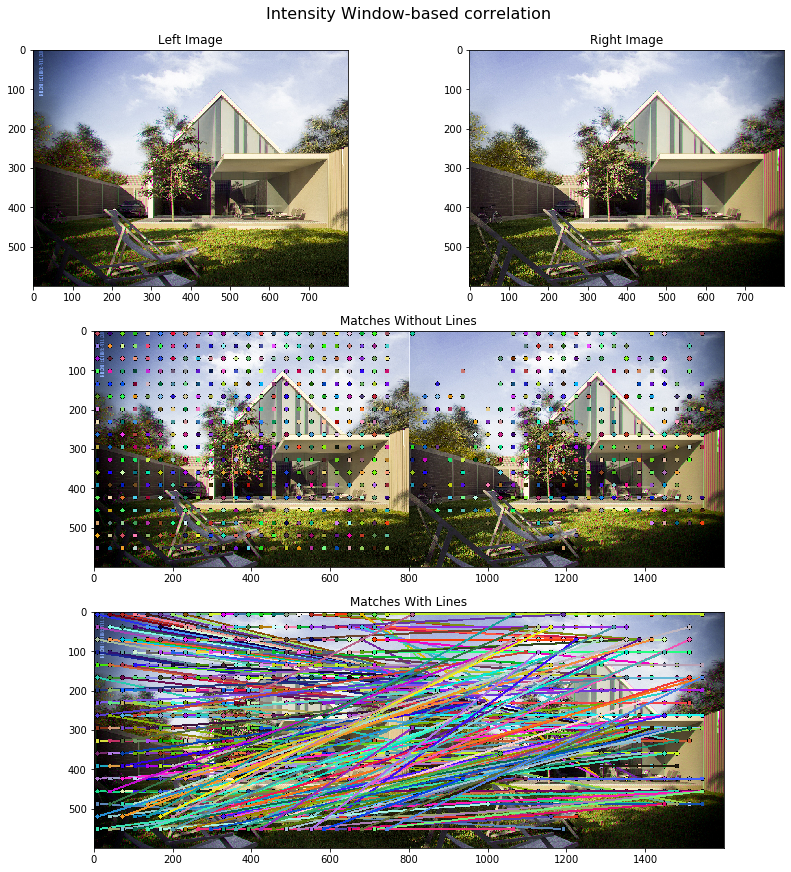

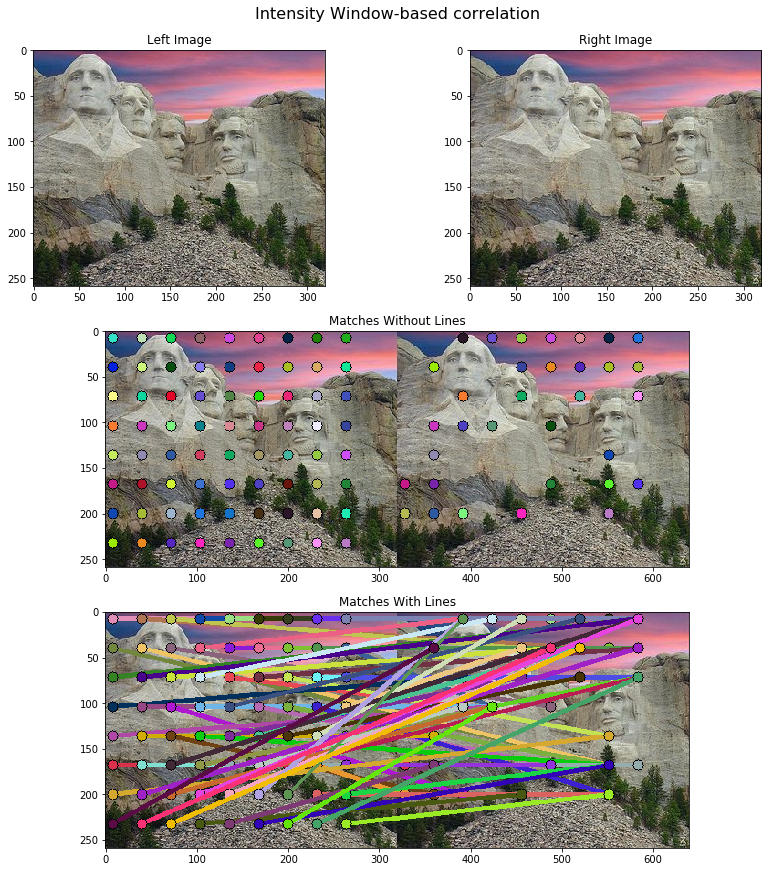

/home/aadilmehdis/anaconda3/envs/ComputerVision/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars


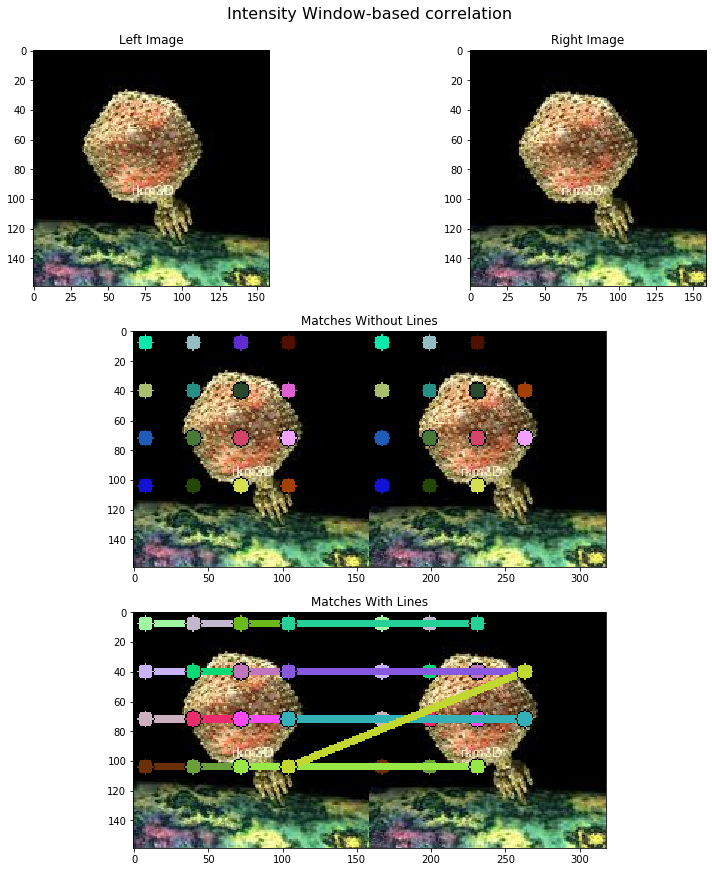

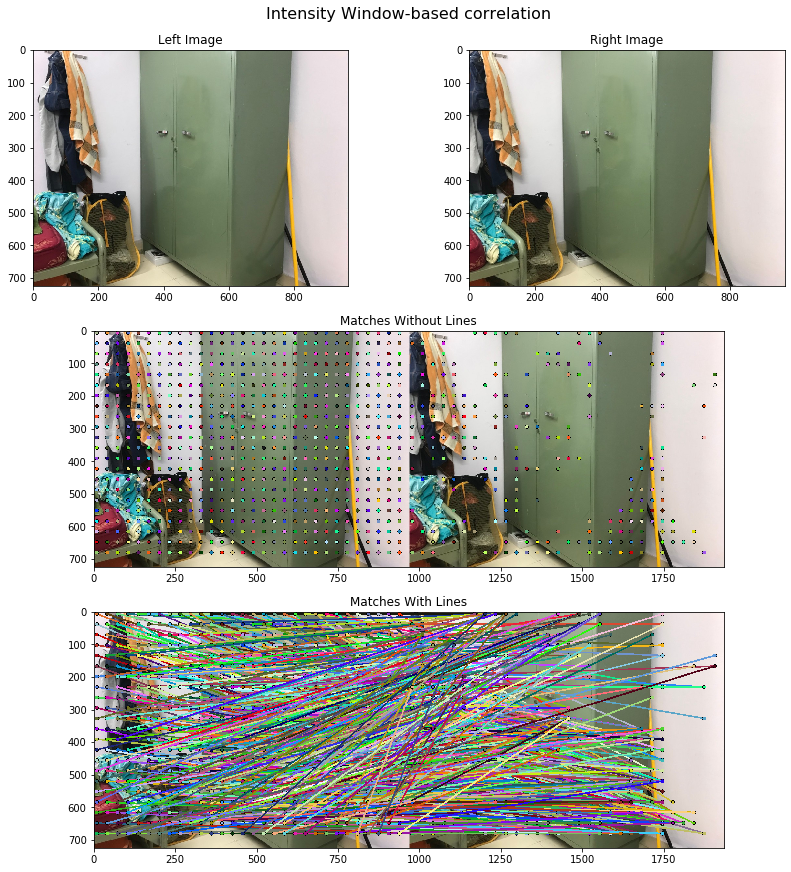

In [14]:
def Question1():
    for img in images:

        h, w = gray(img).shape
        left_image = img[:, :w//2]        
        right_image = img[:, w//2:]


        matches = patch_correlation_matching(gray(left_image), gray(right_image), window_size=32, stride=32)


        fig3 = plt.figure(constrained_layout=True,figsize=(12, 12))
        gs = fig3.add_gridspec(3, 2)
        f3_ax1 = fig3.add_subplot(gs[0, 0])
        f3_ax1.set_title('Left Image')
        plt.imshow(left_image)
        f3_ax2 = fig3.add_subplot(gs[0, 1])
        f3_ax2.set_title('Right Image')
        plt.imshow(right_image)
        f3_ax3 = fig3.add_subplot(gs[1, :])
        f3_ax3.set_title('Matches Without Lines')
        plt.imshow(draw_matches(img, matches, 16))
        f3_ax4 = fig3.add_subplot(gs[-1, :])
        f3_ax4.set_title('Matches With Lines')
        plt.imshow(draw_matches(img, matches, 16, draw_lines=True))
        fig3.suptitle('Intensity Window-based correlation', fontsize=16)
        plt.show()
        
Question1()

### Question 2 :  Intensity Window-based correlation after Stereo Rectification

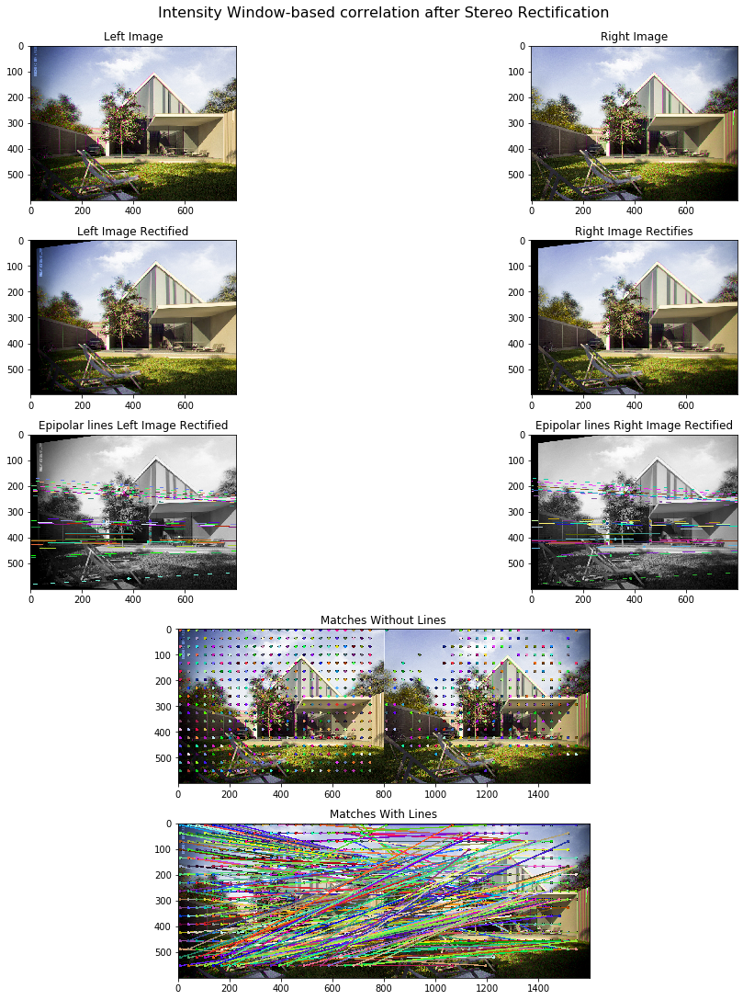

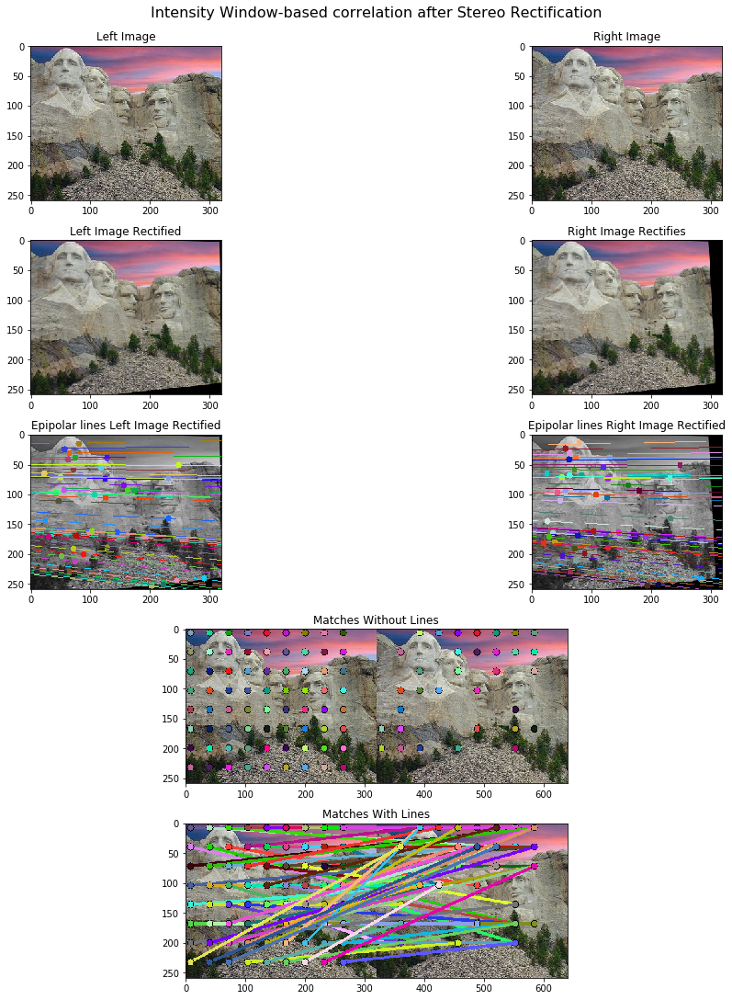

/home/aadilmehdis/anaconda3/envs/ComputerVision/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars


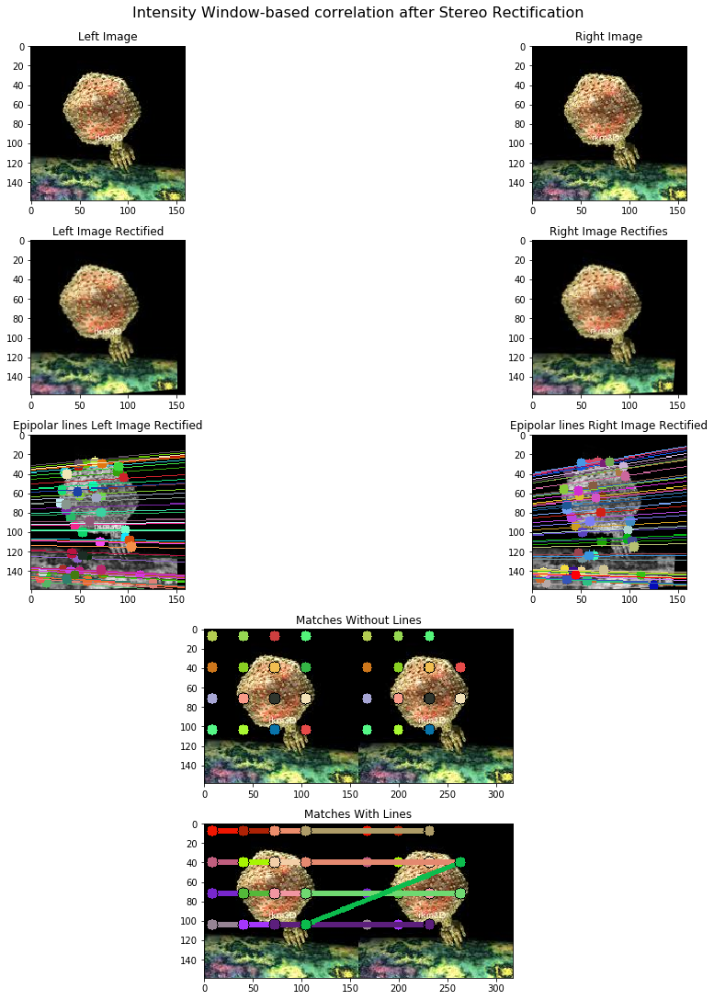

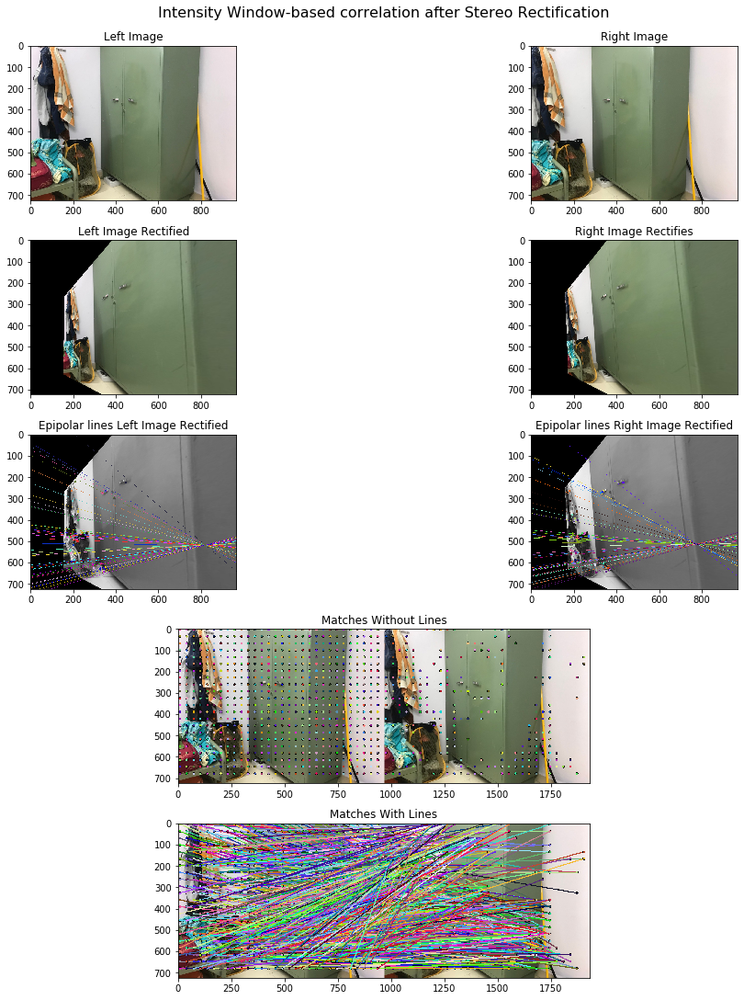

In [15]:
def Question2():
    for img in images:

        h, w = gray(img).shape
        left_image = img[:, :w//2]        
        right_image = img[:, w//2:]

        matches = patch_correlation_matching(gray(left_image), gray(right_image), window_size=32, stride=32)
        l,r, x, xs, F, H1, H2 = stereo_rectification(left_image, right_image)
        x, xs, _ = SIFT_feature_extractor(l, r)
        ll, rr = plot_epipolar_lines(gray(l), gray(r), x, xs, F)
        

        fig3 = plt.figure(constrained_layout=True,figsize=(15, 15))
        gs = fig3.add_gridspec(5, 2)
        f3_ax1 = fig3.add_subplot(gs[0, 0])
        f3_ax1.set_title('Left Image')
        plt.imshow(left_image)
        f3_ax2 = fig3.add_subplot(gs[0, 1])
        f3_ax2.set_title('Right Image')
        plt.imshow(right_image)
        f3_ax3 = fig3.add_subplot(gs[1, 0])
        f3_ax3.set_title('Left Image Rectified')
        plt.imshow(l)
        f3_ax4 = fig3.add_subplot(gs[1, 1])
        f3_ax4.set_title('Right Image Rectifies')
        plt.imshow(r)
        f3_ax5 = fig3.add_subplot(gs[2, 0])
        f3_ax5.set_title('Epipolar lines Left Image Rectified')
        plt.imshow(ll)
        f3_ax6 = fig3.add_subplot(gs[2, 1])
        f3_ax6.set_title('Epipolar lines Right Image Rectified')
        plt.imshow(rr)
        f3_ax7 = fig3.add_subplot(gs[3, :])
        f3_ax7.set_title('Matches Without Lines')
        plt.imshow(draw_matches(img, matches, 16))
        f3_ax8 = fig3.add_subplot(gs[4, :])
        f3_ax8.set_title('Matches With Lines')
        plt.imshow(draw_matches(img, matches, 16, draw_lines=True))
        fig3.suptitle('Intensity Window-based correlation after Stereo Rectification', fontsize=16)
        plt.show()

Question2()

### Question 3 : Greedy Matching Stereo Correspondance

/home/aadilmehdis/anaconda3/envs/ComputerVision/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars


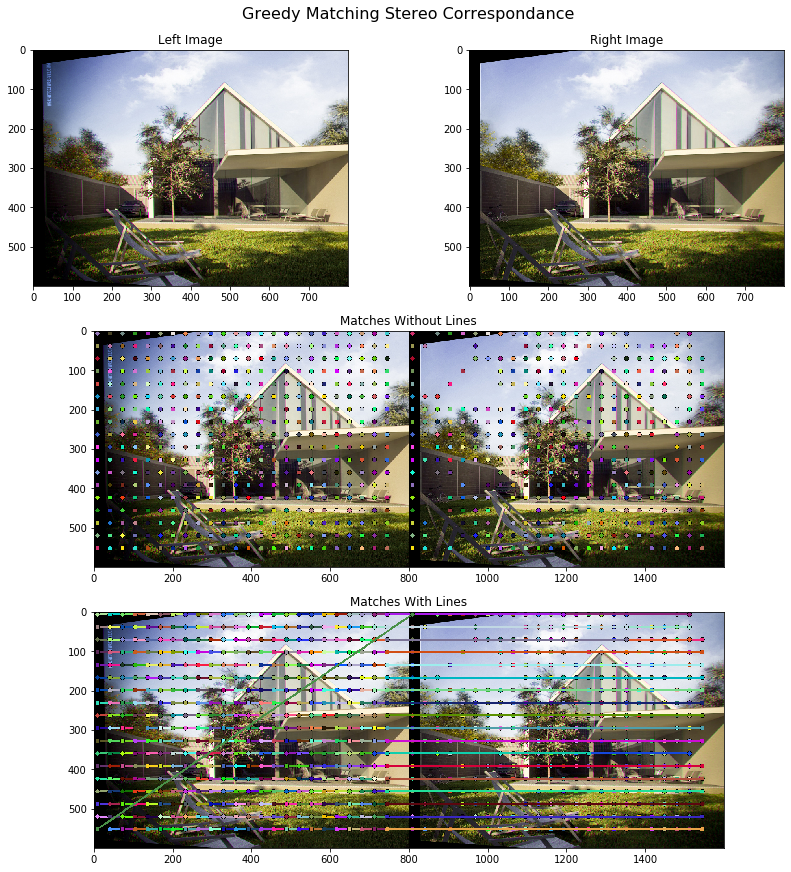

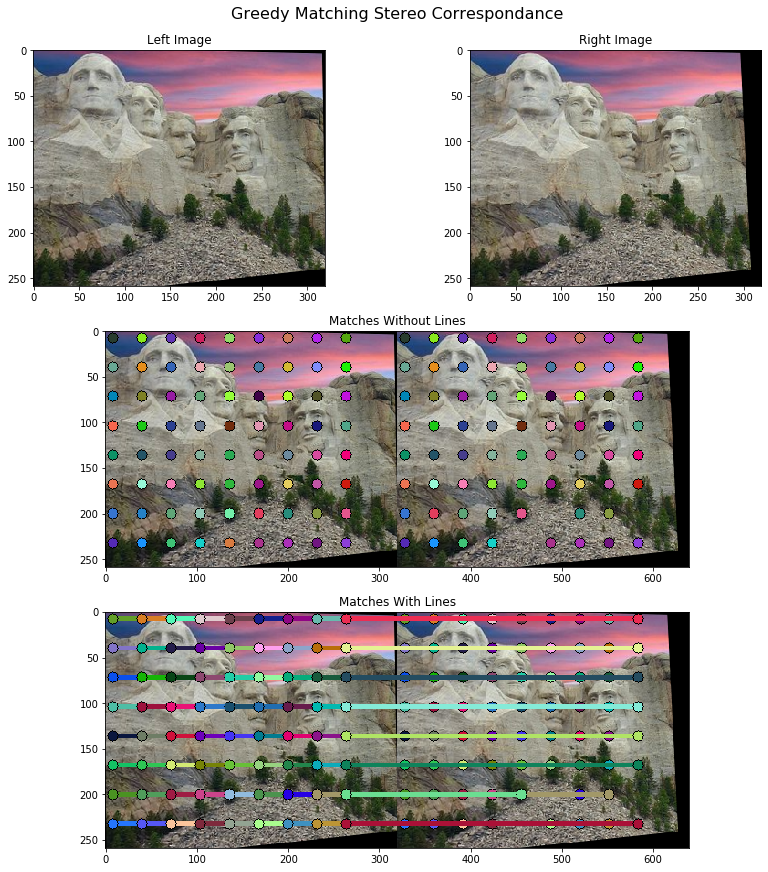

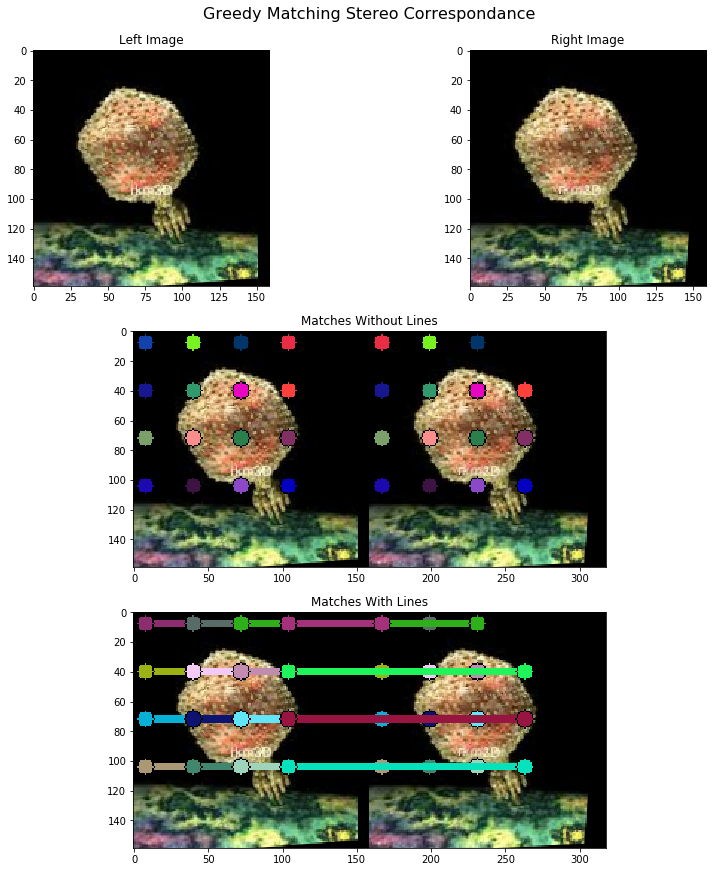

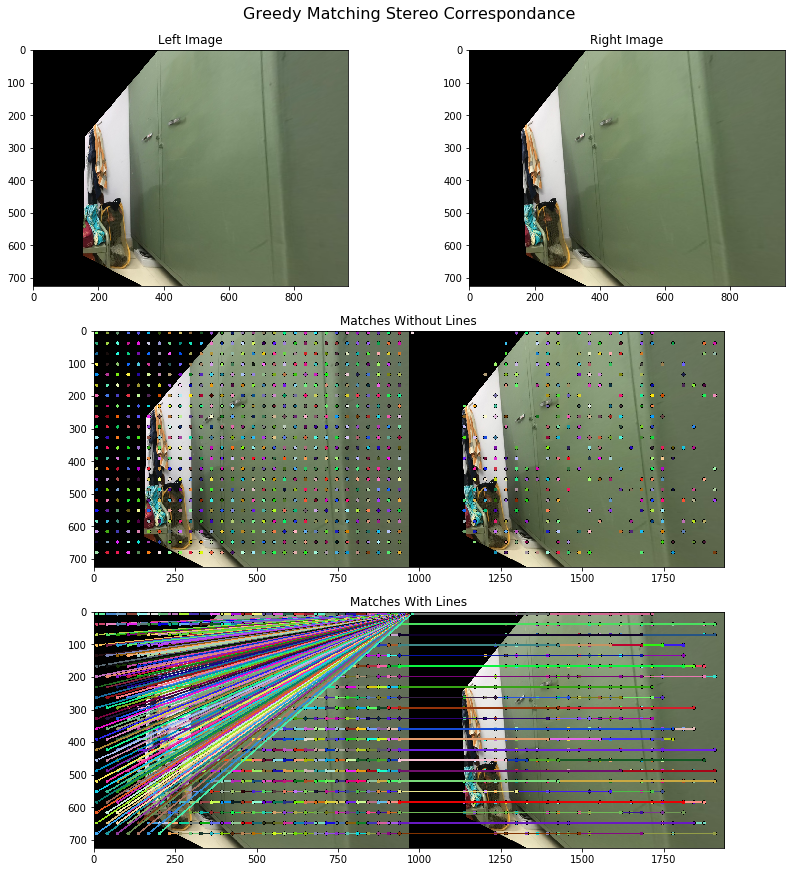

In [16]:
def Question3(is_rectified=False):
    for img in images:

        h, w = gray(img).shape
        left_image = img[:, :w//2]        
        right_image = img[:, w//2:]
        
        if is_rectified:
            left_image, right_image, x, xs, F, H1, H2 = stereo_rectification(left_image, right_image)
            img2 = np.zeros((h,w,3)).astype('uint8')
            img2[0:h, 0:w//2,:] = left_image
            img2[0:h,w//2:,:] = right_image
            img = img2

        matches = stereo_correspondance_greedy(gray(left_image), gray(right_image), 32, 32)

        fig3 = plt.figure(constrained_layout=True,figsize=(12, 12))
        gs = fig3.add_gridspec(3, 2)
        f3_ax1 = fig3.add_subplot(gs[0, 0])
        f3_ax1.set_title('Left Image')
        plt.imshow(left_image)
        f3_ax2 = fig3.add_subplot(gs[0, 1])
        f3_ax2.set_title('Right Image')
        plt.imshow(right_image)
        f3_ax3 = fig3.add_subplot(gs[1, :])
        f3_ax3.set_title('Matches Without Lines')
        plt.imshow(draw_matches(img, matches, 16))
        f3_ax4 = fig3.add_subplot(gs[-1, :])
        f3_ax4.set_title('Matches With Lines')
        plt.imshow(draw_matches(img, matches, 16, draw_lines=True))
        fig3.suptitle('Greedy Matching Stereo Correspondance', fontsize=16)
        plt.show()
        
Question3(is_rectified=True)

### Question 4 : Dynamic Programming Stereo Correspondance

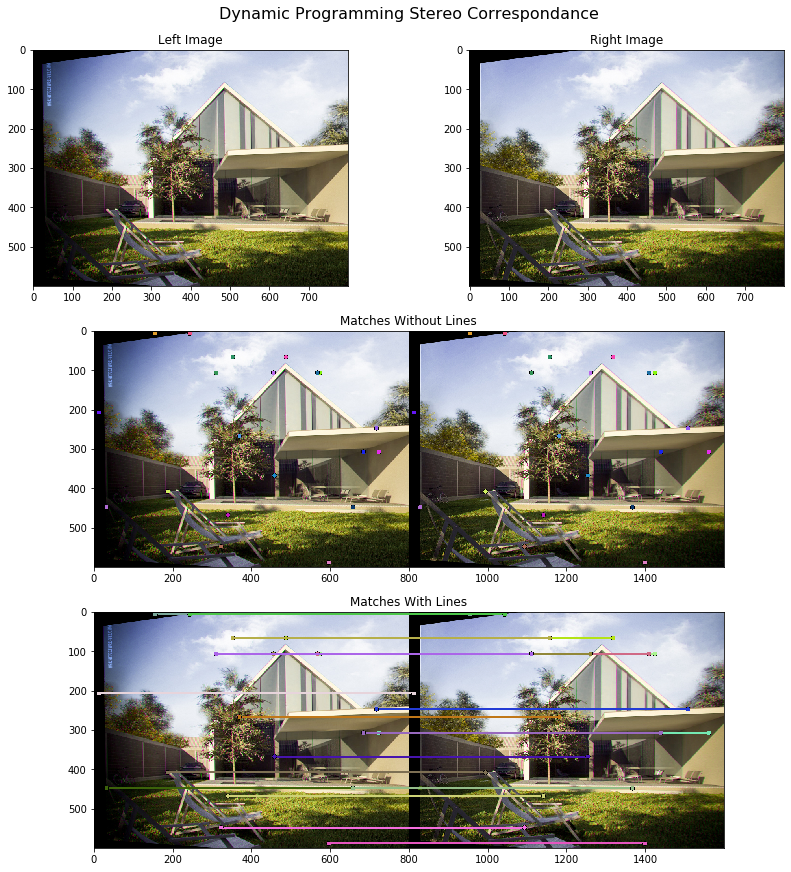

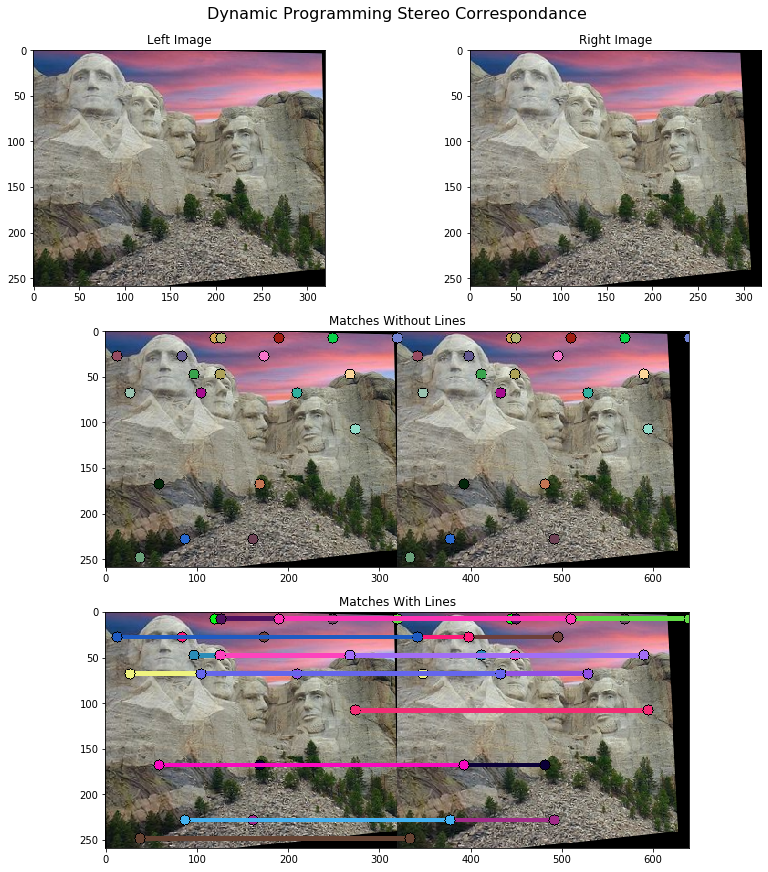

/home/aadilmehdis/anaconda3/envs/ComputerVision/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars


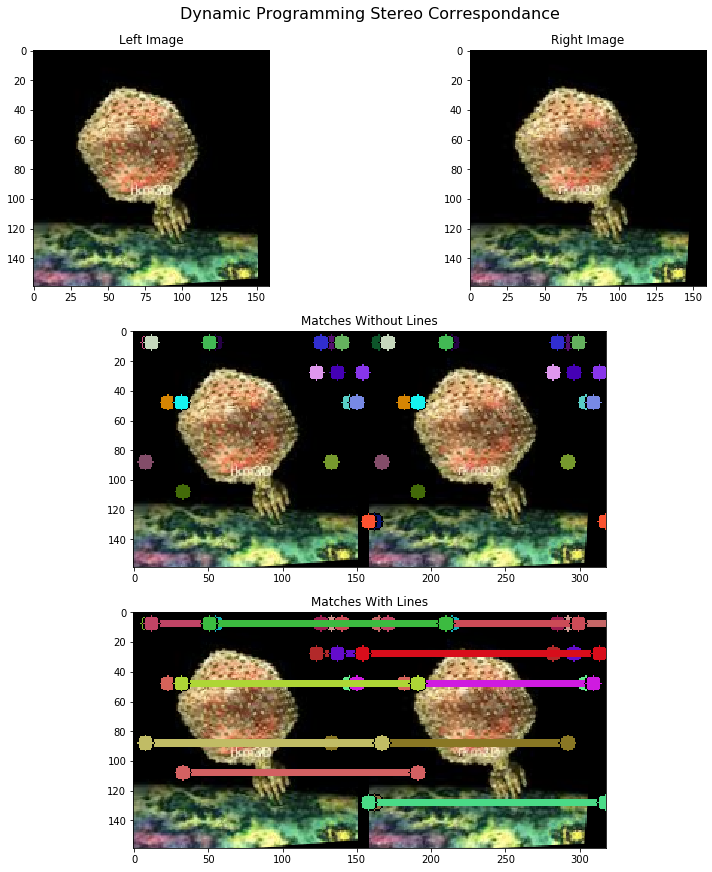

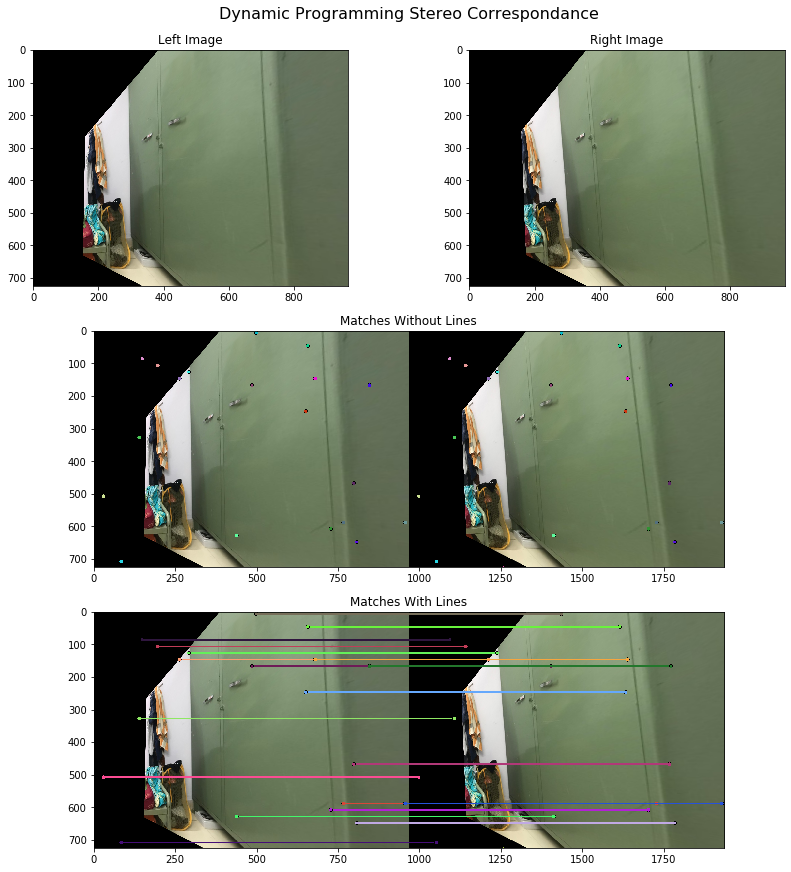

In [17]:
def Question4(is_rectified=False):
    for img in images:

        h, w = gray(img).shape
        left_image = img[:, :w//2]        
        right_image = img[:, w//2:]
        
        if is_rectified:
            left_image, right_image, x, xs, F, H1, H2 = stereo_rectification(left_image, right_image)
            img2 = np.zeros((h,w,3)).astype('uint8')
            img2[0:h, 0:w//2,:] = left_image
            img2[0:h,w//2:,:] = right_image
            img = img2

        matches = stereo_correspondance_dp(gray(left_image), gray(right_image))
        if len(matches>20):
            idx = random.sample(range(0, len(matches)), 20) 

            fig3 = plt.figure(constrained_layout=True,figsize=(12, 12))
            gs = fig3.add_gridspec(3, 2)
            f3_ax1 = fig3.add_subplot(gs[0, 0])
            f3_ax1.set_title('Left Image')
            plt.imshow(left_image)
            f3_ax2 = fig3.add_subplot(gs[0, 1])
            f3_ax2.set_title('Right Image')
            plt.imshow(right_image)
            f3_ax3 = fig3.add_subplot(gs[1, :])
            f3_ax3.set_title('Matches Without Lines')
            plt.imshow(draw_matches(img, matches[idx], 16))
            f3_ax4 = fig3.add_subplot(gs[-1, :])
            f3_ax4.set_title('Matches With Lines')
            plt.imshow(draw_matches(img, matches[idx], 16, draw_lines=True))
            fig3.suptitle('Dynamic Programming Stereo Correspondance', fontsize=16)
            plt.show()
Question4(is_rectified=True)

### Comparision amongst the above mentioned 4 methods
#### Intensity Based Window Matching
***
* This method relies on the fact that if the correlation between the intensities of the two block is large enough then, they are similar. 
* This however does not account for the fact that the ordering might not be the same. It does not take ordering constraint into account.
* This method greedily selects the highest correlation patch as the best matching patch and matches the two blocks
* Matches obtained from this method are not always accurate.
* Window size and the stride taken, also makes a huge difference in the quality of the matches obtained depending on how finely textured the image is.

#### Intensity Based Window Matching after Stereo Correction
* After performing stereo correction the images, are now on the same camera frame. 
* Performing Block Matching on this is more accurate than without stereo correction, however it is still not good as it does not taking ordering contraint into account and matches the highest correlating patches.
* We still match the query block from one image to all the other blocks in the other image, which makes this algorithm slowers.

#### Greedy Stereo Correspondance Intensity Based Window Matching after Stereo Correction
* In this method we exploit the fact that the images are stereo corrected, therefore the epipolar lines must be parallel and the disparity in the y axis must be 0.
* Using this we can maintain the ordering constrain in the y direction, but we still don't have the ordering constraint in the x direction.
* We perform block matching only along the rows, due to stereo normalisation.
* This reduces our search space to 1D, and we get better matches than the above two methods mentioned.

#### Dynamic Programming Stereo Correspondance Intensity Based Window Matching after Stereo Correction
* In this method, after stereo correction, we exploit the fact that the images are stereo corrected, therefore the epipolar lines must be parallel and the disparity in the y axis must be 0.
* We run through each scan line, epipolar line, and perform a longest common subsequence on the two corresponding epipolar lines of the images.
* After this, we take the pixel locations of the epipolar lines that contribute to the LCS and match the corresponding pixels.
* This method also takes care of the ordering constriant in the X and Y axis, already giving us better matches.
* In order to filter out good matches, we take a small window near the matched pixel and perform normalised cross correlation, and select the match only if it is above a certain threshold.
* This increases our confidence on the match.
* Matches obtained from this method are by far the best compared to the above three methods.

### Bonus : SIFT-based Matching comparision with Intensity Window-based Correlation
* As we can see from the results below
* It is observed that intensity window based correlation is not a good descriptor to match points. 
* We can see that points that are matched in the image are not similar, but their intensity profile may be. 
* SIFT on the other hand does a good job of matching points to the corresponding points in the other image due to its scale pyramid form of keypoint detection.
* Since the matched points in SIFT were more accurate, the rectification is correct when using the SIFT descriptor. * Intensity window based correlation on the other hand has makes the image warp with a wrong homography.

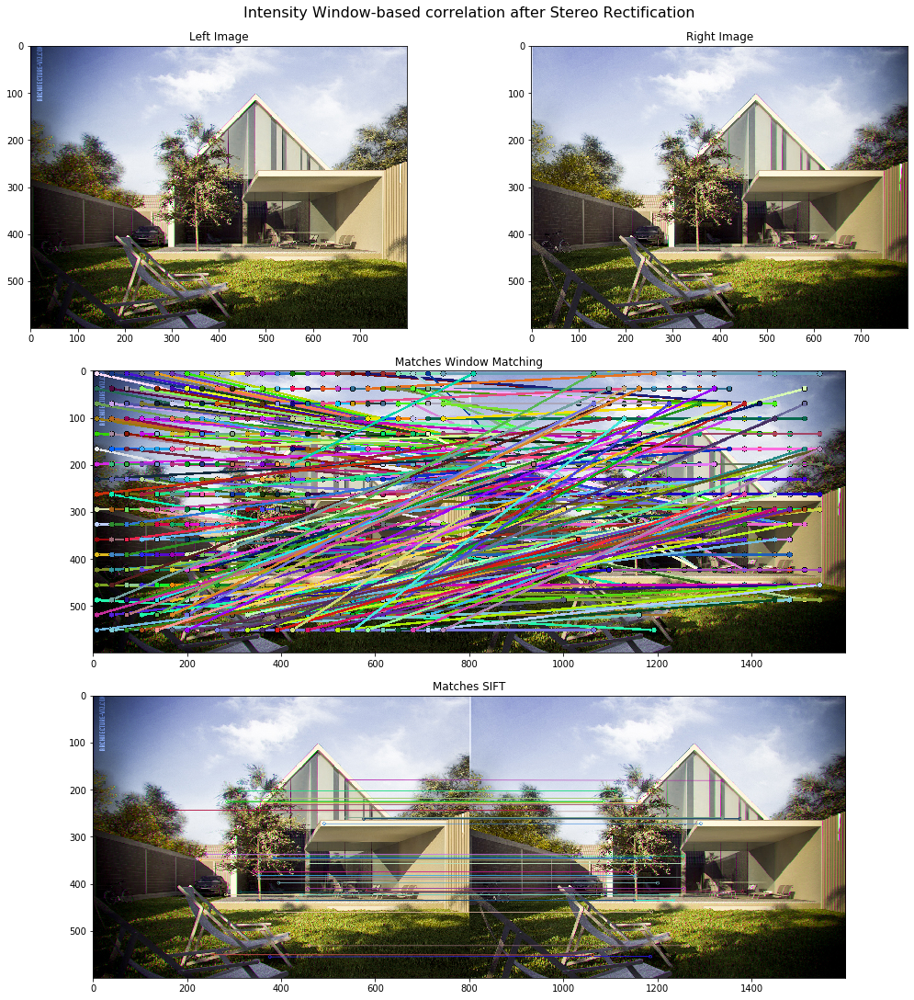

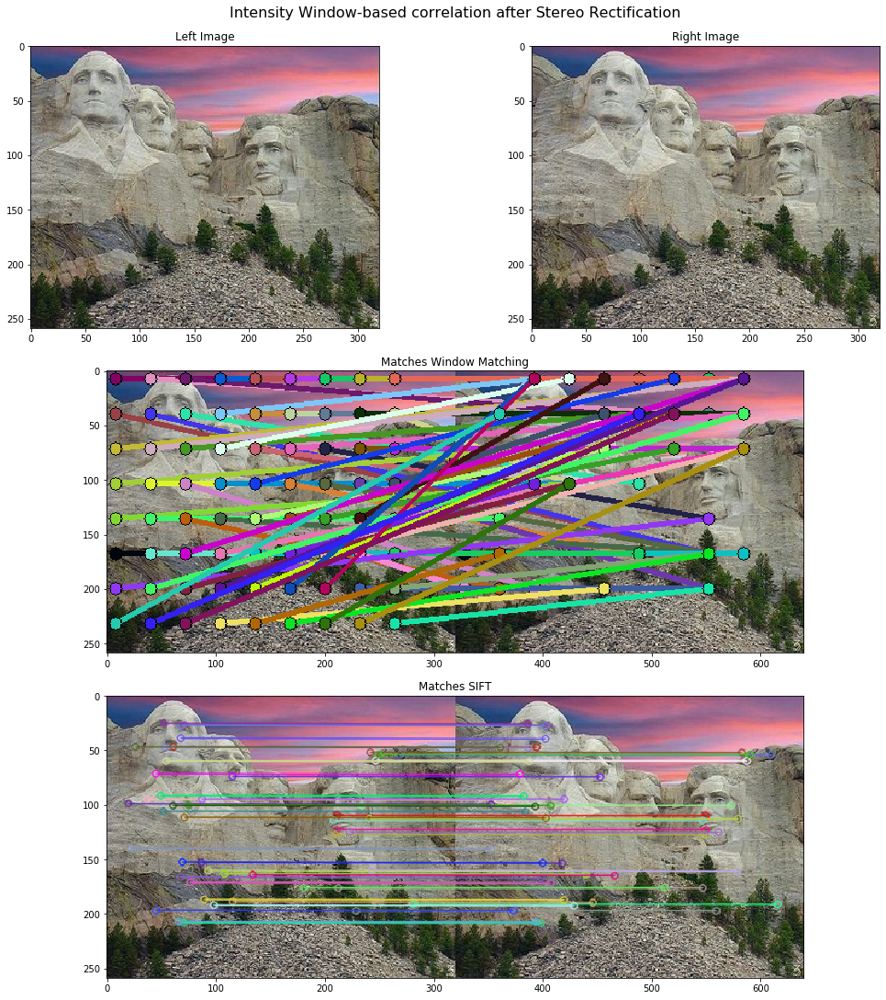

/home/aadilmehdis/anaconda3/envs/ComputerVision/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars


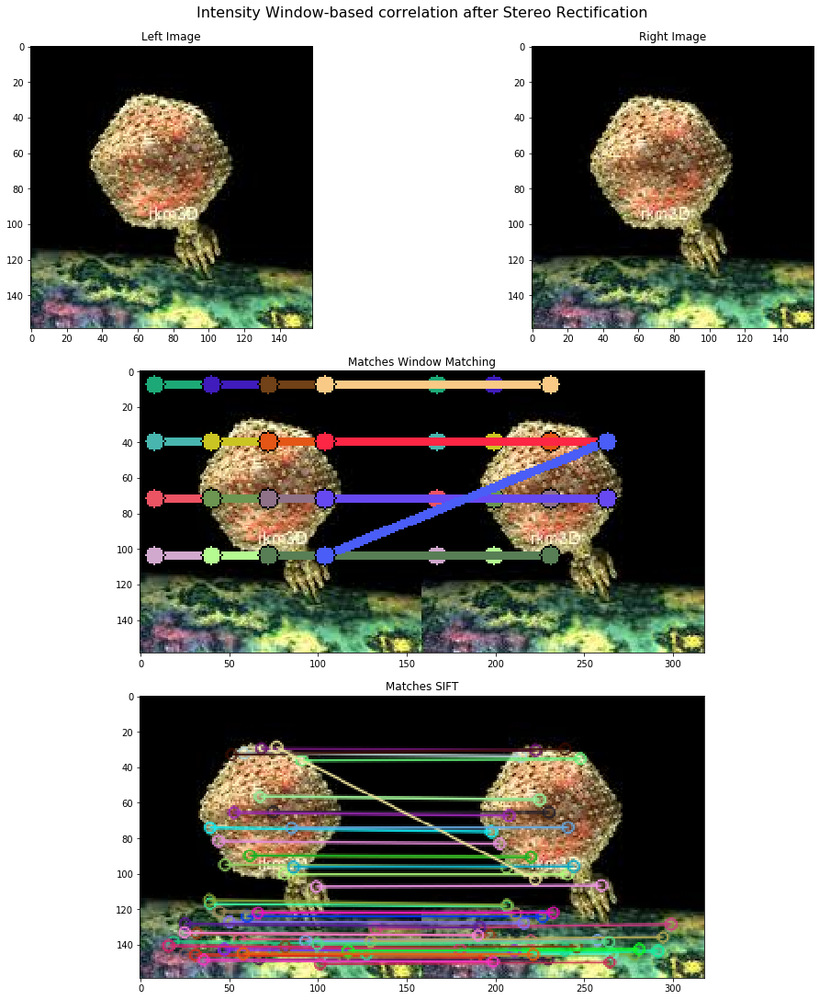

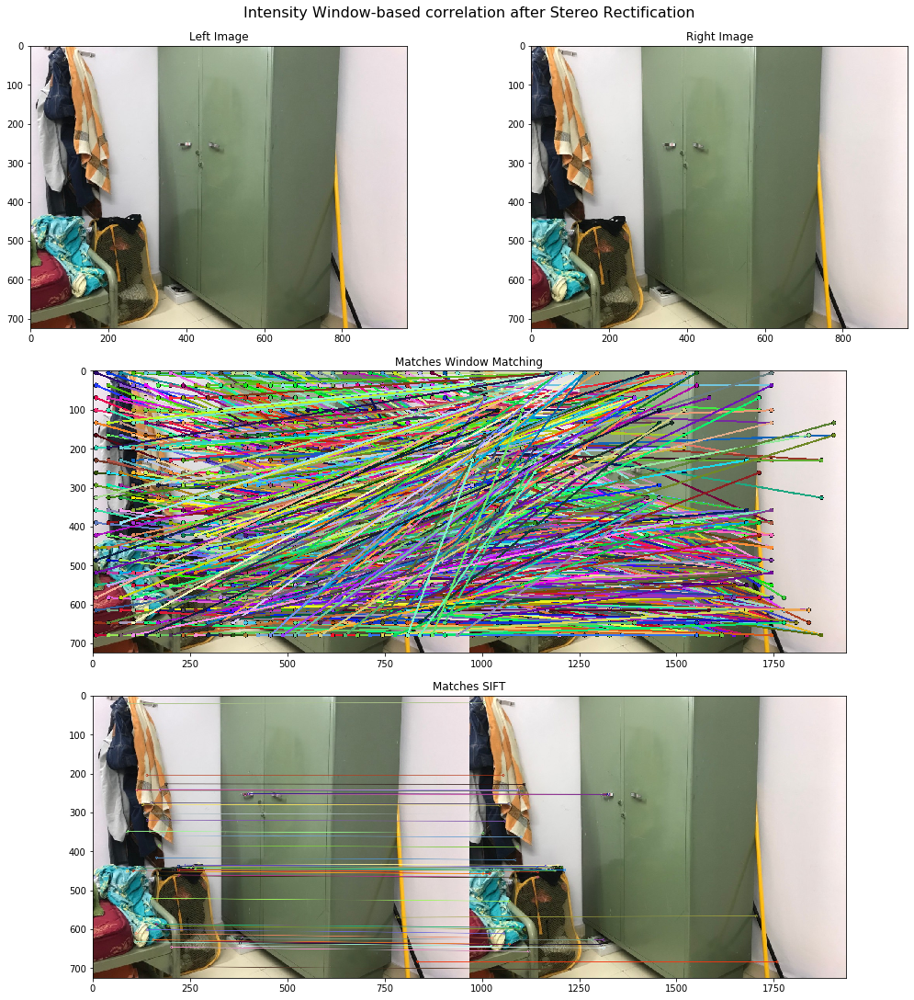

In [18]:
def Bonus():
    for img in images:

        h, w = gray(img).shape
        left_image = img[:, :w//2]        
        right_image = img[:, w//2:]

        matches_window = patch_correlation_matching(gray(left_image), gray(right_image), window_size=32, stride=32)
        
        
        # Feature Key Point Extractor
        sift = cv2.xfeatures2d.SIFT_create(nfeatures=500)
        # Create BF Matcher
        bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
        # Find keypoints and descriptors 
        kp1, desc1 = sift.detectAndCompute(left_image, None)    
        kp2, desc2 = sift.detectAndCompute(right_image, None)
        # Match descriptors
        matches_sift = bf.match(desc1, desc2) 
        # Sort the matches in the order of their distance
        matches_sift = sorted(matches_sift, key = lambda x:x.distance)[:50]
        img3 = cv2.drawMatches(left_image, kp1, right_image, kp2, matches_sift, None, flags=2)

        fig3 = plt.figure(constrained_layout=True,figsize=(15, 15))
        gs = fig3.add_gridspec(3, 2)
        f3_ax1 = fig3.add_subplot(gs[0, 0])
        f3_ax1.set_title('Left Image')
        plt.imshow(left_image)
        f3_ax2 = fig3.add_subplot(gs[0, 1])
        f3_ax2.set_title('Right Image')
        plt.imshow(right_image)
        f3_ax7 = fig3.add_subplot(gs[1, :])
        f3_ax7.set_title('Matches Window Matching')
        plt.imshow(draw_matches(img, matches_window, 16, True))
        f3_ax8 = fig3.add_subplot(gs[2, :])
        f3_ax8.set_title('Matches SIFT')
        plt.imshow(img3)
        fig3.suptitle('Intensity Window-based correlation after Stereo Rectification', fontsize=16)
        plt.show()

Bonus()